In this project we estimate optical flow using a Physics-informed Neural Network (PINN). I have generated the following video of a parrot flying:


In [9]:
from IPython.display import Video

# Embed the video in the notebook. Adjust width as desired.
Video("/home/ryan/Downloads/parrot_flight.mp4", embed=True, width=600)


For the reader's understanding: the optical flow problem is based on the brightness constancy assumption, which states that the brightness of a point remains constant between consecutive frames. This can be written as an inline equation:

$ I(x,y,t) = I(x+u,\, y+v,\, t+\Delta t) $

where $u$ and $v$ are the horizontal and vertical components of the optical flow.

By linearizing the above assumption using a first-order Taylor expansion, we obtain the linearized brightness constancy constraint:

$$ I_x \, u + I_y \, v + I_t = 0, $$

where
- $I_x$ and $I_y$ are the spatial derivatives of the image intensity,
- $I_t$ is the temporal derivative, and
- $u$ and $v$ are the optical flow components.

The Horn–Schunck method formulates the estimation of optical flow as the minimization of an energy functional that combines the brightness constancy term with a smoothness term:

$$
E(u,v) = \iint \left[ \left( I_x \, u + I_y \, v + I_t \right)^2 + \alpha^2 \left( \|\nabla u\|^2 + \|\nabla v\|^2 \right) \right] \, dx \, dy,
$$

where $\alpha$ is a regularization parameter that controls the smoothness of the flow field.

Minimizing this energy functional leads to the following Euler–Lagrange equations:

$$
I_x \left( I_x \, u + I_y \, v + I_t \right) - \alpha^2 \nabla^2 u = 0,
$$

$$
I_y \left( I_x \, u + I_y \, v + I_t \right) - \alpha^2 \nabla^2 v = 0.
$$

Below, I have code which solves this problem numerically for the video provided and shows some sample images of what the flow should look like.


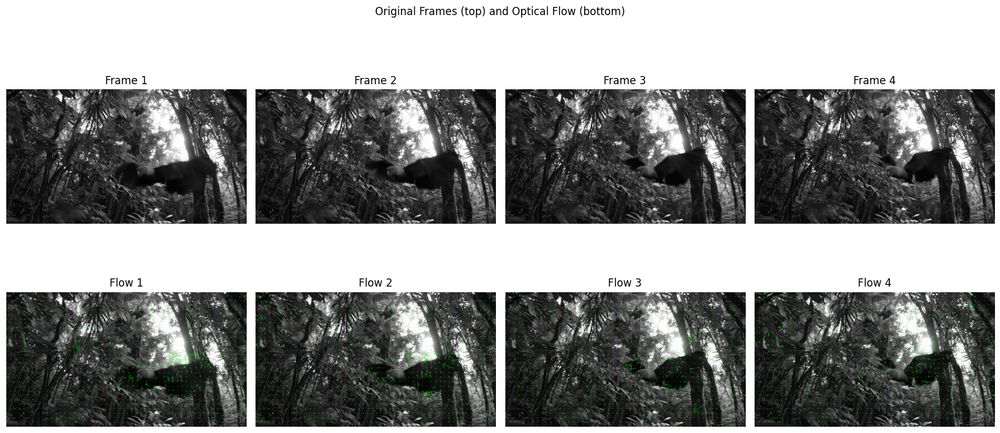

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def horn_schunck(im1, im2, alpha=1.0, Niter=100):
    """
    Compute the optical flow using the Horn-Schunck method.

    Parameters:
        im1, im2 (np.ndarray): Two consecutive grayscale images.
        alpha (float): Regularization parameter.
        Niter (int): Number of iterations.

    Returns:
        u, v (np.ndarray): The horizontal and vertical flow components.
    """
    # Ensure the images are float32 for precision
    im1 = im1.astype(np.float32)
    im2 = im2.astype(np.float32)

    # Define kernels for computing derivatives
    kernel_x = np.array([[-1, 1],
                         [-1, 1]]) * 0.25
    kernel_y = np.array([[-1, -1],
                         [ 1,  1]]) * 0.25
    kernel_t = np.ones((2, 2)) * 0.25

    # Compute gradients
    Ix = cv2.filter2D(im1, -1, kernel_x) + cv2.filter2D(im2, -1, kernel_x)
    Iy = cv2.filter2D(im1, -1, kernel_y) + cv2.filter2D(im2, -1, kernel_y)
    It = cv2.filter2D(im2, -1, kernel_t) - cv2.filter2D(im1, -1, kernel_t)

    # Initialize flow vectors
    u = np.zeros(im1.shape, dtype=np.float32)
    v = np.zeros(im1.shape, dtype=np.float32)

    # Kernel for averaging the neighboring flow vectors.
    kernel_ave = np.array([[1/12, 1/6, 1/12],
                           [1/6,   0,  1/6 ],
                           [1/12, 1/6, 1/12]], dtype=np.float32)

    # Iteratively update the flow estimates
    for _ in range(Niter):
        u_avg = cv2.filter2D(u, -1, kernel_ave)
        v_avg = cv2.filter2D(v, -1, kernel_ave)
        der = (Ix * u_avg + Iy * v_avg + It) / (alpha**2 + Ix**2 + Iy**2)
        u = u_avg - Ix * der
        v = v_avg - Iy * der

    return u, v

def draw_flow(im, u, v, step=16):
    """
    Draw the optical flow vectors as arrows over the image.

    Parameters:
        im (np.ndarray): Grayscale image for background.
        u, v (np.ndarray): Optical flow components.
        step (int): Sampling step for drawing arrows.

    Returns:
        np.ndarray: Image with optical flow arrows drawn.
    """
    im_color = cv2.cvtColor(im.astype(np.uint8), cv2.COLOR_GRAY2BGR)
    h, w = im.shape

    for y in range(0, h, step):
        for x in range(0, w, step):
            pt1 = (x, y)
            pt2 = (int(x + u[y, x]), int(y + v[y, x]))
            cv2.arrowedLine(im_color, pt1, pt2, color=(0, 255, 0), thickness=1, tipLength=0.3)
    return im_color

def process_video(video_path, alpha=1.0, Niter=100, step=16):
    """
    Process a video to compute and display optical flow between consecutive frames.
    In addition to showing the video with imshow, this function saves four pairs
    of images (original and flow visualization) and displays them after processing.

    Parameters:
        video_path (str): Path to the input video file.
        alpha (float): Regularization parameter for Horn-Schunck.
        Niter (int): Number of iterations for Horn-Schunck.
        step (int): Sampling step for drawing arrows.
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error opening video file:", video_path)
        return

    ret, prev_frame = cap.read()
    if not ret:
        print("Error reading the first frame from video.")
        cap.release()
        return

    # Convert the first frame to grayscale
    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    # Lists to store sample pairs (original, optical flow visualization)
    orig_samples = []
    flow_samples = []
    sample_count = 0  # We'll store only 4 pairs

    while True:
        ret, frame = cap.read()
        if not ret:
            break  # End of video

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Compute the Horn-Schunck optical flow between the previous and current frame
        u, v = horn_schunck(prev_gray, gray, alpha=alpha, Niter=Niter)

        # Visualize the flow on the previous frame
        flow_vis = draw_flow(prev_gray, u, v, step=step)
        cv2.imshow("Horn-Schunck Optical Flow", flow_vis)

        # Save the first 4 pairs for later display
        if sample_count < 4:
            orig_samples.append(prev_gray.copy())
            flow_samples.append(flow_vis.copy())
            sample_count += 1

        # Wait for 30ms or until the 'q' key is pressed
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

        # Update the previous frame
        prev_gray = gray

    cap.release()
    cv2.destroyAllWindows()

    # After processing the video, display the saved samples
    if orig_samples and flow_samples:
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle("Original Frames (top) and Optical Flow (bottom)")
        for i in range(4):
            # Original grayscale image
            axes[0, i].imshow(orig_samples[i], cmap="gray")
            axes[0, i].axis("off")
            axes[0, i].set_title(f"Frame {i+1}")
            # Optical flow overlay
            # Convert BGR (from OpenCV) to RGB (for matplotlib)
            flow_rgb = cv2.cvtColor(flow_samples[i], cv2.COLOR_BGR2RGB)
            axes[1, i].imshow(flow_rgb)
            axes[1, i].axis("off")
            axes[1, i].set_title(f"Flow {i+1}")
        plt.tight_layout()
        plt.show()

if __name__ == '__main__':
    # Set parameters for the Horn-Schunck algorithm
    alpha = 1.0   # Regularization parameter
    Niter = 100   # Number of iterations
    step = 16     # Arrow drawing step

    # Provide the path to your video file
    video_path = "/home/ryan/Downloads/parrot_flight.mp4"

    process_video(video_path, alpha=alpha, Niter=Niter, step=step)



## Neural Network Architecture and the PINN Mechanism

In our approach, we use a fully connected neural network (often called a multilayer perceptron or MLP) to approximate the optical flow fields \( u(x,y) \) and \( v(x,y) \) over the image domain. The network takes as input the normalized spatial coordinates \((x,y)\) and outputs a two-dimensional vector \([u, v]\), which represents the horizontal and vertical components of the flow at that point.

### Neural Network Architecture

The network architecture is relatively simple:
- **Input Layer:**  
  The network accepts a 2-dimensional input corresponding to the coordinates \((x,y)\) normalized to the range \([0,1]\).
- **Hidden Layers:**  
  We use several hidden layers (e.g., 4 layers) with a moderate number of neurons (e.g., 64 units per layer) and apply a non-linear activation function (such as the hyperbolic tangent, \(\tanh\)). This non-linearity enables the network to learn complex mappings from spatial coordinates to flow vectors.
- **Output Layer:**  
  The final layer outputs a 2-dimensional vector \([u, v]\) which corresponds to the estimated optical flow at the input location.

### The PINN Mechanism

The core idea behind a Physics-Informed Neural Network (PINN) is to incorporate the underlying physical laws—in our case, the partial differential equations (PDEs) governing optical flow—directly into the loss function during training. Rather than relying solely on labeled data, the network is trained to produce outputs that satisfy the known PDEs as well as any available data constraints.

For optical flow estimation using the Horn–Schunck formulation, the PDEs arise from the minimization of the energy functional

$$
E(u,v) = \iint \left[ \left( I_x \, u + I_y \, v + I_t \right)^2 + \alpha^2 \left( \|\nabla u\|^2 + \|\nabla v\|^2 \right) \right] \, dx \, dy,
$$

which enforces:
1. **Brightness Constancy:**  
   The linearized brightness constancy assumption is given by

   $$
   I_x \, u + I_y \, v + I_t = 0,
   $$

   where \(I_x\), \(I_y\) and \(I_t\) are the spatial and temporal derivatives of the image intensity.

2. **Smoothness Constraint:**  
   A regularization term controlled by the parameter \(\alpha\) that promotes smoothness in the flow field.

Minimizing the energy functional leads to the Euler–Lagrange equations:

$$
I_x \left( I_x \, u + I_y \, v + I_t \right) - \alpha^2 \nabla^2 u = 0,
$$

$$
I_y \left( I_x \, u + I_y \, v + I_t \right) - \alpha^2 \nabla^2 v = 0.
$$

### Training the PINN

In the PINN framework, we enforce these PDE constraints by defining a loss function that penalizes the residuals of the PDE. For a set of collocation points \(\{(x_i, y_i)\}_{i=1}^N\) (typically a random subset of the image domain), the network's predicted flow \([u(x_i,y_i), v(x_i,y_i)]\) is differentiated with respect to \(x\) and \(y\) using automatic differentiation. This allows us to compute the first and second derivatives needed for the residuals of the PDE.

The loss function is formulated as:

$$
\mathcal{L} = \frac{1}{N} \sum_{i=1}^{N} \left( \left[ I_x(x_i,y_i) \left( I_x(x_i,y_i) \, u(x_i,y_i) + I_y(x_i,y_i) \, v(x_i,y_i) + I_t(x_i,y_i) \right) - \alpha^2 \nabla^2 u(x_i,y_i) \right]^2 + \left[ I_y(x_i,y_i) \left( I_x(x_i,y_i) \, u(x_i,y_i) + I_y(x_i,y_i) \, v(x_i,y_i) + I_t(x_i,y_i) \right) - \alpha^2 \nabla^2 v(x_i,y_i) \right]^2 \right).
$$

During training, the network parameters are updated to minimize this loss. In this way, the network not only learns from data (e.g., image intensity derivatives computed from the video frames) but also respects the underlying physics described by the PDE. The PINN framework effectively "solves" the PDE by adjusting the network parameters until the predicted optical flow field satisfies the brightness constancy and smoothness constraints embedded in the loss function.

### Summary

- **Architecture:** A simple MLP that maps normalized \((x,y)\) coordinates to flow vectors \([u,v]\).
- **PINN Mechanism:** Embeds the governing PDE (derived from the Horn–Schunck formulation) into the training loss, ensuring that the network's predictions satisfy both the brightness constancy and smoothness constraints.
- **Training:** The network is trained on a subset of collocation points using automatic differentiation to compute necessary derivatives, and mixed precision training is used to reduce memory usage.

This approach enables the network to estimate optical flow in a way that is consistent with the underlying physics, even when explicit flow labels are unavailable.


We first just do training on a pair of images to estimate the solution to the PDE. We provide more information about the training procedure in the next markdown block.

/tmp/ipykernel_4802/1583177217.py:129: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/tmp/ipykernel_4802/1583177217.py:148: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 0000: Loss = 0.025941
Epoch 0100: Loss = 0.011646
Epoch 0200: Loss = 0.010847
Epoch 0300: Loss = 0.017527
Epoch 0400: Loss = 0.012320
Epoch 0500: Loss = 0.013185
Epoch 0600: Loss = 0.010640
Epoch 0700: Loss = 0.012272
Epoch 0800: Loss = 0.013343
Epoch 0900: Loss = 0.011739


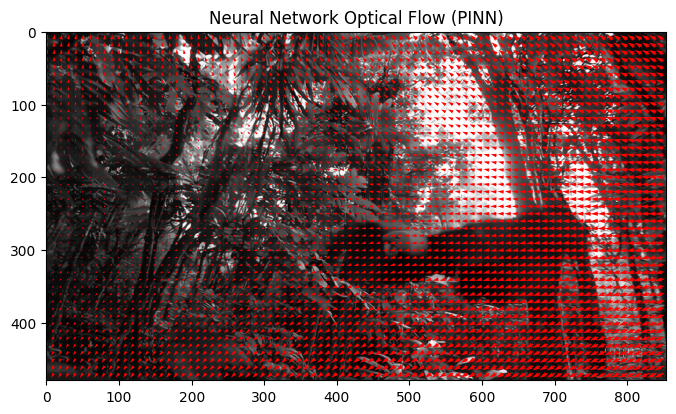

In [6]:
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.cuda.amp import autocast, GradScaler

# ------------------------------
# 1. Define the Neural Network
# ------------------------------
class FlowNet(nn.Module):
    """
    A simple fully connected neural network that approximates the optical flow fields u(x,y) and v(x,y).
    """
    def __init__(self, hidden_dim=64, num_layers=4):
        super(FlowNet, self).__init__()
        layers = []
        layers.append(nn.Linear(2, hidden_dim))
        layers.append(nn.Tanh())
        for _ in range(num_layers - 1):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.Tanh())
        layers.append(nn.Linear(hidden_dim, 2))  # output: [u, v]
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)

# ------------------------------
# 2. Helper Functions
# ------------------------------
def compute_image_gradients(img):
    """
    Compute the spatial gradients (I_x, I_y) using Sobel operators.
    """
    Ix = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    return Ix, Iy

def pinn_loss(model, coords, Ix_tensor, Iy_tensor, It_tensor, alpha):
    """
    Computes the physics-informed loss based on the Horn-Schunck PDE residuals.
    
    For each collocation point (x,y):
        r_u = I_x*(I_x u + I_y v + I_t) - alpha^2 * (u_xx + u_yy)
        r_v = I_y*(I_x u + I_y v + I_t) - alpha^2 * (v_xx + v_yy)
    and then we minimize the mean squared residuals.
    
    Parameters:
      - model: the neural network approximating [u, v].
      - coords: tensor of shape (batch_size,2) with (x,y) positions (normalized).
      - Ix_tensor, Iy_tensor, It_tensor: tensors of shape (batch_size,1) with image gradients.
      - alpha: regularization parameter.
    """
    # Ensure we can compute derivatives wrt coords
    coords.requires_grad_(True)
    
    # Get the network outputs
    flow = model(coords)  # shape (batch_size,2)
    u = flow[:, 0:1]
    v = flow[:, 1:2]
    
    # Compute first derivatives of u and v wrt (x,y)
    grad_u = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    grad_v = torch.autograd.grad(v, coords, grad_outputs=torch.ones_like(v), create_graph=True)[0]
    
    # Compute second derivatives (for Laplacian) using autograd:
    u_xx = torch.autograd.grad(grad_u[:, 0:1], coords, grad_outputs=torch.ones_like(grad_u[:, 0:1]), create_graph=True)[0][:, 0:1]
    u_yy = torch.autograd.grad(grad_u[:, 1:2], coords, grad_outputs=torch.ones_like(grad_u[:, 1:2]), create_graph=True)[0][:, 1:2]
    v_xx = torch.autograd.grad(grad_v[:, 0:1], coords, grad_outputs=torch.ones_like(grad_v[:, 0:1]), create_graph=True)[0][:, 0:1]
    v_yy = torch.autograd.grad(grad_v[:, 1:2], coords, grad_outputs=torch.ones_like(grad_v[:, 1:2]), create_graph=True)[0][:, 1:2]
    
    lap_u = u_xx + u_yy
    lap_v = v_xx + v_yy
    
    # Data term: brightness constancy residual (linearized)
    data_residual = Ix_tensor * u + Iy_tensor * v + It_tensor  # shape (batch_size,1)
    
    # PDE residuals from Horn-Schunck Euler–Lagrange equations
    res_u = Ix_tensor * data_residual - alpha**2 * lap_u
    res_v = Iy_tensor * data_residual - alpha**2 * lap_v
    
    loss = torch.mean(res_u**2) + torch.mean(res_v**2)
    return loss

# ------------------------------
# 3. Main Routine: Setup & Training with Memory Reduction Strategies
# ------------------------------
def main():
    # Load two consecutive frames from a video (or two images)
    cap = cv2.VideoCapture("/home/ryan/Downloads/parrot_flight.mp4")
    ret, frame1 = cap.read()
    ret, frame2 = cap.read()
    cap.release()
    if frame1 is None or frame2 is None:
        print("Error reading video frames.")
        return

    # Convert frames to grayscale and normalize to [0,1]
    gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0
    gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0

    # Compute spatial gradients on the first frame (or average over frames)
    Ix, Iy = compute_image_gradients(gray1)
    # Compute the temporal gradient
    It = gray2 - gray1

    # Get image dimensions
    h, w = gray1.shape

    # Create a grid of (x, y) coordinates normalized to [0, 1]
    x = np.linspace(0, 1, w)
    y = np.linspace(0, 1, h)
    xx, yy = np.meshgrid(x, y)
    coords = np.stack([xx.flatten(), yy.flatten()], axis=-1)  # shape (N,2)
    coords_tensor = torch.tensor(coords, dtype=torch.float32).cuda()  # Move to GPU if available

    # Convert the gradients to tensors of shape (N,1) and move to GPU
    Ix_tensor = torch.tensor(Ix.flatten()[:, None], dtype=torch.float32).cuda()
    Iy_tensor = torch.tensor(Iy.flatten()[:, None], dtype=torch.float32).cuda()
    It_tensor = torch.tensor(It.flatten()[:, None], dtype=torch.float32).cuda()

    # Initialize the neural network model and optimizer
    model = FlowNet(hidden_dim=64, num_layers=4).cuda()  # move model to GPU
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    
    # Set up mixed precision training scaler
    scaler = GradScaler()

    # Regularization parameter from Horn–Schunck
    alpha = 1.0

    # Training parameters
    num_epochs = 1000
    batch_size = 4096  # Use a smaller random subset of points per iteration
    N_total = coords_tensor.shape[0]

    for epoch in range(num_epochs):
        # Randomly sample a subset of collocation points
        indices = torch.randperm(N_total)[:batch_size]
        coords_batch = coords_tensor[indices]
        Ix_batch = Ix_tensor[indices]
        Iy_batch = Iy_tensor[indices]
        It_batch = It_tensor[indices]

        optimizer.zero_grad()
        with autocast():
            loss = pinn_loss(model, coords_batch, Ix_batch, Iy_batch, It_batch, alpha)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        if epoch % 100 == 0:
            print(f"Epoch {epoch:04d}: Loss = {loss.item():.6f}")

    # After training, evaluate the predicted flow field over the entire grid
    with torch.no_grad():
        # Turn off grad and move to CPU
        flow_pred = model(coords_tensor).cpu().numpy()  # shape (N,2)
    u_pred = flow_pred[:, 0].reshape((h, w))
    v_pred = flow_pred[:, 1].reshape((h, w))

    # Visualize the optical flow using a quiver plot over the first frame
    plt.figure(figsize=(8, 6))
    plt.imshow(gray1, cmap="gray")
    step = 10  # draw arrows every 10 pixels
    X, Y = np.meshgrid(np.arange(0, w, step), np.arange(0, h, step))
    plt.quiver(X, Y, u_pred[::step, ::step], v_pred[::step, ::step], color="red")
    plt.title("Neural Network Optical Flow (PINN)")
    plt.show()

if __name__ == "__main__":
    main()


## Training and Testing Procedure

Our approach leverages a Physics-Informed Neural Network (PINN) to estimate optical flow by enforcing the underlying partial differential equations (PDEs) that arise from the Horn–Schunck formulation. In our training setup, we use the frames from a video as our data source. To assess the network's ability to generalize, we split the video into two segments:

- **Training Set (First 2/3 of Frames):**  
  We use consecutive frame pairs from the first two-thirds of the video. For each training iteration, we randomly select one such pair and compute the necessary image gradients (spatial derivatives \(I_x\) and \(I_y\) from the first frame, and the temporal derivative \(I_t\) from the difference between the two frames). These derivatives are then used to form the loss function that penalizes the residual of the optical flow PDE.  
  Additionally, we use two strategies to manage memory consumption:
  - **Subsampling Collocation Points:** Instead of evaluating the loss over every pixel, we randomly sample a subset (batch) of points from the entire image grid.
  - **Mixed Precision Training:** Using PyTorch’s Automatic Mixed Precision (AMP) allows us to reduce memory usage by computing some operations in half precision.

- **Testing Set (Final 1/3 of Frames):**  
  After training, we evaluate the trained PINN on a few selected consecutive frame pairs from the final one-third of the video. For these test pairs:
  - We compute the optical flow using the classical Horn–Schunck method (denoted as the *computed flow*).
  - Simultaneously, we use the trained PINN to predict the optical flow (denoted as the *predicted flow*).
  - Finally, we calculate and visualize the difference between the computed flow and the PINN's prediction. This comparison helps to assess how well the PINN generalizes to unseen data from the later part of the video.

### Detailed Explanation of the Training Code

1. **Video Loading and Preprocessing:**
   - All video frames are loaded into a list.
   - Each frame is converted to grayscale and normalized to the range \([0, 1]\).
   - We determine the split point by calculating \( \text{train\_cutoff} = \lfloor \frac{2}{3} \times \text{(total frames)} \rfloor \). Frames before this cutoff are used for training, and frames after are used for testing.

2. **Coordinate Grid Setup:**
   - A grid of normalized \((x,y)\) coordinates is created that corresponds to the pixel positions in the image.
   - This grid is used throughout training and testing, allowing the network to predict optical flow at any point in the image.

3. **Training Loop:**
   - For each epoch, a random training pair is selected from the first 2/3 of the frames.
   - For the chosen pair, the spatial gradients \(I_x\) and \(I_y\) are computed from the first frame, and the temporal derivative \(I_t\) is computed as the difference between the consecutive frames.
   - A random subset of the coordinate grid (collocation points) is then selected.
   - The loss is computed based on the residual of the Horn–Schunck PDE using these collocation points.
   - Mixed precision training is applied during the forward and backward passes to reduce memory usage.
   - The optimizer updates the network parameters to minimize the loss.

4. **Testing and Evaluation:**
   - After training, the network is evaluated on test pairs from the final 1/3 of the video.
   - For each test pair, the classical Horn–Schunck method is applied to compute the optical flow.
   - The trained PINN is also used to predict the optical flow over the entire image grid.
   - The difference between the computed (classical) flow and the PINN’s predicted flow is calculated.
   - These differences, along with the computed and predicted flows, are visualized using quiver plots. This helps us see where and how the PINN might differ from the classical method, providing insight into its generalization performance on unseen data.

By training on the first 2/3 of the video and testing on the final 1/3, we ensure that the network is not simply memorizing the data but is learning a model of the underlying physics that can generalize to new, unseen frames.


Total frames: 150, Training frames: 100, Testing frames: 50
Number of training pairs: 99
Epoch 0000: Loss = 0.024665


/tmp/ipykernel_4802/647930079.py:172: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/tmp/ipykernel_4802/647930079.py:209: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch 0100: Loss = 0.011428
Epoch 0200: Loss = 0.010378
Epoch 0300: Loss = 0.007952
Epoch 0400: Loss = 0.005581
Epoch 0500: Loss = 0.032203
Epoch 0600: Loss = 0.015612
Epoch 0700: Loss = 0.017322
Epoch 0800: Loss = 0.012568
Epoch 0900: Loss = 0.010357
Epoch 1000: Loss = 0.022720
Epoch 1100: Loss = 0.023070
Epoch 1200: Loss = 0.029864
Epoch 1300: Loss = 0.007285
Epoch 1400: Loss = 0.013028
Epoch 1500: Loss = 0.018681
Epoch 1600: Loss = 0.026430
Epoch 1700: Loss = 0.015942
Epoch 1800: Loss = 0.020084
Epoch 1900: Loss = 0.014104
Epoch 2000: Loss = 0.018706
Epoch 2100: Loss = 0.017822
Epoch 2200: Loss = 0.019624
Epoch 2300: Loss = 0.020224
Epoch 2400: Loss = 0.016430
Epoch 2500: Loss = 0.012686
Epoch 2600: Loss = 0.015173
Epoch 2700: Loss = 0.007005
Epoch 2800: Loss = 0.008517
Epoch 2900: Loss = 0.016367
Epoch 3000: Loss = 0.010118
Epoch 3100: Loss = 0.010177
Epoch 3200: Loss = 0.007347
Epoch 3300: Loss = 0.016790
Epoch 3400: Loss = 0.014329
Epoch 3500: Loss = 0.019889
Epoch 3600: Loss = 0

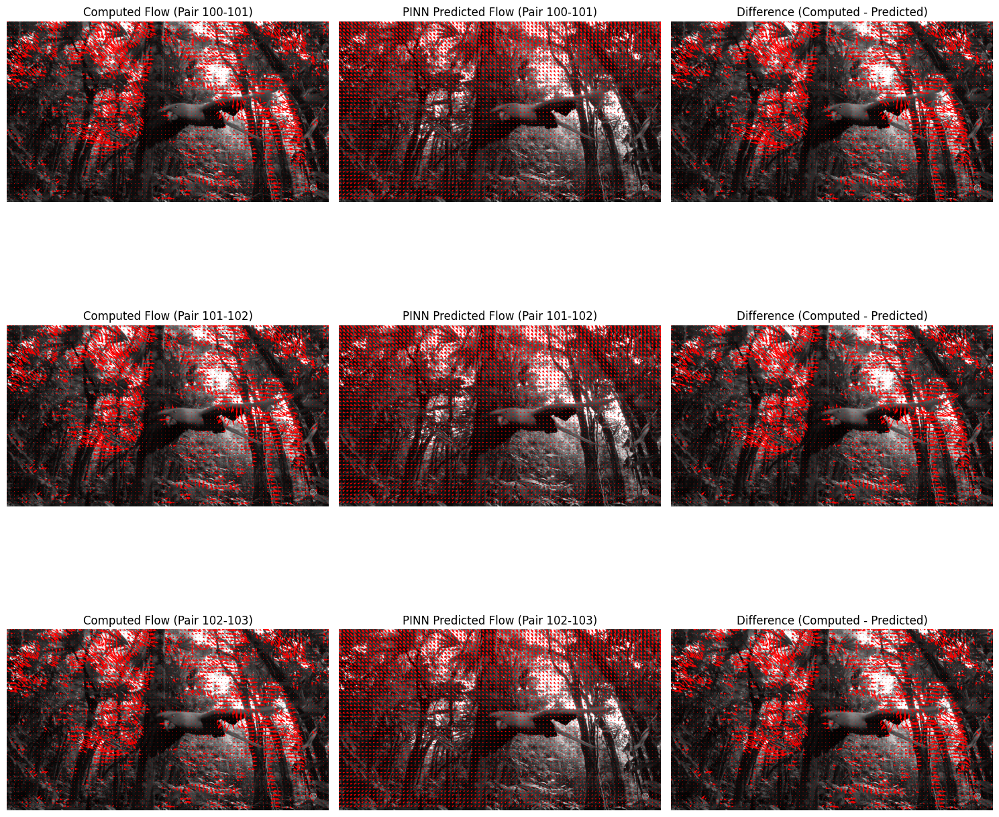

In [8]:
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.cuda.amp import autocast, GradScaler

# ================================
# 1. Define the Neural Network
# ================================
class FlowNet(nn.Module):
    """
    A simple fully connected network that approximates the optical flow fields u(x,y) and v(x,y)
    for a given image pair.
    """
    def __init__(self, hidden_dim=64, num_layers=4):
        super(FlowNet, self).__init__()
        layers = []
        layers.append(nn.Linear(2, hidden_dim))
        layers.append(nn.Tanh())
        for _ in range(num_layers - 1):
            layers.append(nn.Linear(hidden_dim, hidden_dim))
            layers.append(nn.Tanh())
        layers.append(nn.Linear(hidden_dim, 2))  # outputs: [u, v]
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)

# ================================
# 2. Helper Functions
# ================================
def compute_image_gradients(img):
    """
    Compute the spatial gradients (I_x, I_y) using Sobel operators.
    """
    Ix = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    Iy = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    return Ix, Iy

def horn_schunck(im1, im2, alpha=1.0, Niter=100):
    """
    Compute the optical flow between two grayscale images using the Horn-Schunck method.
    """
    im1 = im1.astype(np.float32)
    im2 = im2.astype(np.float32)
    
    # Derivative kernels:
    kernel_x = np.array([[-1, 1],
                         [-1, 1]]) * 0.25
    kernel_y = np.array([[-1, -1],
                         [ 1,  1]]) * 0.25
    kernel_t = np.ones((2,2)) * 0.25

    Ix = cv2.filter2D(im1, -1, kernel_x) + cv2.filter2D(im2, -1, kernel_x)
    Iy = cv2.filter2D(im1, -1, kernel_y) + cv2.filter2D(im2, -1, kernel_y)
    It = cv2.filter2D(im2, -1, kernel_t) - cv2.filter2D(im1, -1, kernel_t)

    u = np.zeros(im1.shape, dtype=np.float32)
    v = np.zeros(im1.shape, dtype=np.float32)

    kernel_ave = np.array([[1/12, 1/6, 1/12],
                           [1/6,   0,  1/6],
                           [1/12, 1/6, 1/12]], dtype=np.float32)
    
    for _ in range(Niter):
        u_avg = cv2.filter2D(u, -1, kernel_ave)
        v_avg = cv2.filter2D(v, -1, kernel_ave)
        der = (Ix * u_avg + Iy * v_avg + It) / (alpha**2 + Ix**2 + Iy**2)
        u = u_avg - Ix * der
        v = v_avg - Iy * der

    return u, v

def pinn_loss(model, coords, Ix_tensor, Iy_tensor, It_tensor, alpha):
    """
    Compute the PINN loss that penalizes the residual of the Horn–Schunck PDE.
    
    For each collocation point (x,y):
      r_u = I_x*(I_x u + I_y v + I_t) - alpha^2 * (u_xx + u_yy)
      r_v = I_y*(I_x u + I_y v + I_t) - alpha^2 * (v_xx + v_yy)
    
    Parameters:
      model: the PINN (FlowNet) approximating [u, v].
      coords: tensor of shape (batch_size,2) with normalized (x,y) coordinates.
      Ix_tensor, Iy_tensor, It_tensor: tensors of shape (batch_size,1) for gradients.
      alpha: regularization parameter.
    """
    coords.requires_grad_(True)
    flow = model(coords)  # shape: (batch_size, 2)
    u = flow[:, 0:1]
    v = flow[:, 1:2]

    # Compute first derivatives:
    grad_u = torch.autograd.grad(u, coords, grad_outputs=torch.ones_like(u), create_graph=True)[0]
    grad_v = torch.autograd.grad(v, coords, grad_outputs=torch.ones_like(v), create_graph=True)[0]
    
    # Compute second derivatives (Laplacian components):
    u_xx = torch.autograd.grad(grad_u[:, 0:1], coords, grad_outputs=torch.ones_like(grad_u[:, 0:1]), create_graph=True)[0][:, 0:1]
    u_yy = torch.autograd.grad(grad_u[:, 1:2], coords, grad_outputs=torch.ones_like(grad_u[:, 1:2]), create_graph=True)[0][:, 1:2]
    v_xx = torch.autograd.grad(grad_v[:, 0:1], coords, grad_outputs=torch.ones_like(grad_v[:, 0:1]), create_graph=True)[0][:, 0:1]
    v_yy = torch.autograd.grad(grad_v[:, 1:2], coords, grad_outputs=torch.ones_like(grad_v[:, 1:2]), create_graph=True)[0][:, 1:2]

    lap_u = u_xx + u_yy
    lap_v = v_xx + v_yy

    # Data term: brightness constancy residual (linearized)
    data_residual = Ix_tensor * u + Iy_tensor * v + It_tensor  # (batch_size,1)

    # PDE residuals:
    res_u = Ix_tensor * data_residual - alpha**2 * lap_u
    res_v = Iy_tensor * data_residual - alpha**2 * lap_v

    loss = torch.mean(res_u**2) + torch.mean(res_v**2)
    return loss

def load_video_frames(video_path):
    """
    Loads all frames from the given video.
    """
    frames = []
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error opening video:", video_path)
        return frames
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(frame)
    cap.release()
    return frames

# ================================
# 3. Main Routine: Training & Testing
# ================================
def main():
    video_path = "/home/ryan/Downloads/parrot_flight.mp4"
    frames = load_video_frames(video_path)
    if len(frames) < 2:
        print("Not enough frames in video!")
        return

    num_frames = len(frames)
    train_cutoff = int((2/3) * num_frames)  # use first 2/3 for training
    print(f"Total frames: {num_frames}, Training frames: {train_cutoff}, Testing frames: {num_frames - train_cutoff}")

    # We'll work in grayscale and normalized [0,1]
    def preprocess(frame):
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY).astype(np.float32) / 255.0
        return gray

    # Preprocess all frames once
    gray_frames = [preprocess(frame) for frame in frames]

    # Get image dimensions from the first frame.
    h, w = gray_frames[0].shape

    # Create a grid of normalized (x,y) coordinates that is fixed for all frames.
    x = np.linspace(0, 1, w)
    y = np.linspace(0, 1, h)
    xx, yy = np.meshgrid(x, y)
    coords = np.stack([xx.flatten(), yy.flatten()], axis=-1)  # shape: (N, 2)
    N_total = coords.shape[0]
    # Prepare the full coordinate tensor on GPU.
    coords_tensor_full = torch.tensor(coords, dtype=torch.float32).cuda()

    # Initialize the network and optimizer.
    model = FlowNet(hidden_dim=64, num_layers=4).cuda()
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    scaler = GradScaler()
    alpha_reg = 1.0  # Horn-Schunck regularization parameter

    # Training hyperparameters
    num_epochs = 10000
    batch_size = 4096  # use a subset of collocation points per training iteration

    # Collect indices of valid training pairs from the training portion
    # (we use pairs: (frame_i, frame_i+1) for i in [0, train_cutoff-1])
    train_pair_indices = list(range(train_cutoff - 1))
    num_train_pairs = len(train_pair_indices)
    print(f"Number of training pairs: {num_train_pairs}")

    # === Training Loop ===
    for epoch in range(num_epochs):
        # Randomly choose one training pair
        idx = np.random.choice(train_pair_indices)
        gray1 = gray_frames[idx]
        gray2 = gray_frames[idx+1]

        # Compute gradients on the first frame
        Ix, Iy = compute_image_gradients(gray1)
        It = gray2 - gray1

        # Convert gradients to tensors (flattened) and move to GPU.
        Ix_tensor_full = torch.tensor(Ix.flatten()[:, None], dtype=torch.float32).cuda()
        Iy_tensor_full = torch.tensor(Iy.flatten()[:, None], dtype=torch.float32).cuda()
        It_tensor_full = torch.tensor(It.flatten()[:, None], dtype=torch.float32).cuda()

        # Randomly sample a batch of collocation points.
        indices = torch.randperm(N_total)[:batch_size]
        coords_batch = coords_tensor_full[indices]
        Ix_batch = Ix_tensor_full[indices]
        Iy_batch = Iy_tensor_full[indices]
        It_batch = It_tensor_full[indices]

        optimizer.zero_grad()
        with autocast():
            loss = pinn_loss(model, coords_batch, Ix_batch, Iy_batch, It_batch, alpha_reg)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        if epoch % 100 == 0:
            print(f"Epoch {epoch:04d}: Loss = {loss.item():.6f}")

    # === Testing: Process a few sample pairs from the final 1/3 ===
    # We'll choose a few test pairs and compare the Horn-Schunck (computed) flow with the PINN (predicted) flow.
    test_pair_indices = list(range(train_cutoff, num_frames - 1))
    num_samples_to_display = 3  # number of test pairs to show

    fig, axes = plt.subplots(num_samples_to_display, 3, figsize=(15, 5 * num_samples_to_display))
    if num_samples_to_display == 1:
        axes = np.expand_dims(axes, 0)  # ensure 2D array of axes

    for i in range(num_samples_to_display):
        idx = test_pair_indices[i]
        test_gray1 = gray_frames[idx]
        test_gray2 = gray_frames[idx+1]

        # Compute classical Horn-Schunck flow on test pair.
        u_computed, v_computed = horn_schunck(test_gray1, test_gray2, alpha=alpha_reg, Niter=100)

        # For the same test pair, compute gradients on the first frame.
        Ix_test, Iy_test = compute_image_gradients(test_gray1)
        It_test = test_gray2 - test_gray1
        Ix_tensor_test = torch.tensor(Ix_test.flatten()[:, None], dtype=torch.float32).cuda()
        Iy_tensor_test = torch.tensor(Iy_test.flatten()[:, None], dtype=torch.float32).cuda()
        It_tensor_test = torch.tensor(It_test.flatten()[:, None], dtype=torch.float32).cuda()

        # Use the trained PINN to predict optical flow over the entire domain.
        with torch.no_grad():
            flow_pred = model(coords_tensor_full).cpu().numpy()  # shape: (N_total, 2)
        u_pred = flow_pred[:, 0].reshape((h, w))
        v_pred = flow_pred[:, 1].reshape((h, w))

        # Compute difference (computed - predicted) for u and v.
        diff_u = u_computed - u_pred
        diff_v = v_computed - v_pred

        # For visualization, we will show three images:
        # 1. The computed flow field (quiver on the test frame)
        # 2. The predicted flow field (quiver on the test frame)
        # 3. The difference (vector difference field)
        step = 10  # sampling step for quiver

        # Prepare a quiver plot helper function.
        def quiver_image(img, U, V, title):
            plt.imshow(img, cmap="gray")
            X, Y = np.meshgrid(np.arange(0, w, step), np.arange(0, h, step))
            plt.quiver(X, Y, U[::step, ::step], V[::step, ::step], color="red", angles='xy')
            plt.title(title)
            plt.axis("off")

        ax = axes[i, 0]
        plt.sca(ax)
        quiver_image(test_gray1, u_computed, v_computed, f"Computed Flow (Pair {idx}-{idx+1})")

        ax = axes[i, 1]
        plt.sca(ax)
        quiver_image(test_gray1, u_pred, v_pred, f"PINN Predicted Flow (Pair {idx}-{idx+1})")

        ax = axes[i, 2]
        plt.sca(ax)
        quiver_image(test_gray1, diff_u, diff_v, f"Difference (Computed - Predicted)")
        
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()
